In [ ]:
# section for uploading file with training data
from google.colab import files
uploaded = files.upload()

Saving Police_Stations__2011_.csv to Police_Stations__2011_ (1).csv
Saving temp-prcp2003_2015.csv to temp-prcp2003_2015 (1).csv
Saving test.csv.zip to test.csv (1).zip
Saving train.csv.zip to train.csv.zip
Saving unemployment_rate_2003-2015.csv to unemployment_rate_2003-2015.csv
Saving weather2003-2015.csv to weather2003-2015.csv


In [ ]:
#  first cells represent data transformation with outlier removal, duplicates
# removal, timestamp data adaptation and extraction, forming additional
# daraframes required for EDA. This notebook is separated in subchapters for
# clear navigation.

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
from scipy.spatial import distance
from typing import Union
import os
from io import BytesIO
from IPython.display import Image
from collections import Counter
import matplotlib.dates as mdates
import datetime

# set all dataframes about weather, police stations and unemployment rate
unemployment_df = None
weather_type_df = None
temperature_df = None
police_stations_df = None

# take all data from csv's and zip
for file in uploaded.keys():
    if file == 'train.csv.zip':
        train_df = pd.read_csv(BytesIO(uploaded[file]), compression='zip')
    elif file == 'unemployment_rate_2003-2015.csv':
        unemployment_df = pd.read_csv(BytesIO(uploaded[file]))
    elif file == 'weather2003-2015.csv':
        weather_type_df = pd.read_csv(BytesIO(uploaded[file]))
    elif file == 'Police_Stations__2011_.csv':
        police_stations_df = pd.read_csv(BytesIO(uploaded[file]))
    elif file == 'temp-prcp2003_2015.csv':
        temperature_df = pd.read_csv(BytesIO(uploaded[file]))
    elif file == 'test.csv.zip':
        test_df = pd.read_csv(BytesIO(uploaded[file]), compression='zip')

# **Functions to work with data**

In [ ]:
def make_harmonic_features(value, period=24):
    """
    remaps cyclical data from line axis to the circular axis ->
    important for correct data interpretation by regression
    """
    value *= 2 * np.pi / period
    return np.cos(value), np.sin(value)

In [ ]:
def filter_col_outliers(df: pd.DataFrame, column, up_threshold, low_threshold):
    """
    return dataframe where column is filtered from high-value outliers
    """
    return df[(df[column] < up_threshold) & (df[column] > low_threshold)]

In [ ]:
def form_time_columns(df: pd.DataFrame, timestamp_column: str):
    """
    return dataframe with appended 
    """
    df[timestamp_column] = pd.to_datetime(df[timestamp_column])
    df["Year"]           = df[timestamp_column].dt.year
    df["Month"]          = df[timestamp_column].dt.month
    df["Day"]            = df[timestamp_column].dt.date
    df["DayOfYear"]      = df[timestamp_column].dt.dayofyear
    df["Hour"]           = df[timestamp_column].dt.hour
    df["Minute"]         = df[timestamp_column].dt.minute
    return df

In [ ]:
def weekday_to_numerical(df: pd.DataFrame, column: str):
    """
    return column where weekdays will be transformed to numerical values
    """
    week_day_mapper = {
        'Monday': 0,
        'Tuesday': 1,
        'Wednesday': 2,
        'Thursday': 3,
        'Friday': 4,
        'Saturday': 5,
        'Sunday': 6,
    }
    
    return train_df[column].map(week_day_mapper)

In [ ]:
def count_category_and_time(df: pd.DataFrame, category, time):
    """
    return dataframe of counting elements by groups in pair with time categories
    """
    count_df = df
    count_df["Count"] = 1
    count_df = count_df[[category, time, 'Count']]
    count_df = count_df.groupby([category, time]).agg('sum')
    count_df = count_df.reset_index()
    return count_df

In [ ]:
def find_columns_below_threshold(df: pd.DataFrame, threshold):
    """
    Return array of columns that are below defined threshold
    """
    categories_below_threshold = df[df["Count"] < threshold]['Category'].unique()
    return categories_below_threshold

In [ ]:
def encode_address(df: pd.DataFrame, delimeter: str, column):
    """
    Perform address encoding, where street is 1 and intersection is 0
    """
    address = []
    for index in range(len(df)):
        if delimeter in df.iloc[index, column]:
            address.append(0)
        else:
            address.append(1)

    df['address_encoded'] = address
    return df

In [ ]:
def form_seasons(df: pd.DataFrame, column):
    """
    Form new column called 'seasons' depending on month
    """
    df['Season'] = df[column]
    df['Season'] = df['Season'].map({
        1 : 1,
        2 : 1,
        3 : 2,
        4 : 2,
        5 : 2,
        6 : 3,
        7 : 3,
        8 : 3,
        9 : 4,
        10: 4,
        11: 4,
        12: 1
    })
    return df

In [ ]:
def form_streets_and_intersections(df: pd.DataFrame, address_column: str):
    """
    Form two new columns called 'street' and 'intersection' that take address by reges from
    specified column
    """
    regex_intersection = '\w+\s\w+\s[/]\s\w+\s\w+'
    regex_street       = '\d+\s\w+\s\w+\s\w+\s\w+'

    intersection = df.Address.str.extract(r'(\w+\s\w+\s[/]\s\w+\s\w+)').fillna(0)
    street       = df.Address.str.extract(r'\d+\s\w+\s\w+\s(\w+\s\w+)').fillna(0)

    intersection = intersection.rename(columns = {0 : 'Intersection'})
    street       = street.rename(columns = {0 : 'Street'})

    df = pd.concat([df, street, intersection], axis=1)

    return df

In [ ]:
def form_street_and_intersection_count_df(df: pd.DataFrame):
    """
    Form new dataframe that shows crime frequency depending on street or intersection by categories
    """
    local_df = pd.DataFrame({})
    for elem in df['Street'].unique():
        if elem != 0:
            count = df[df['Street'] == elem]['Category'].value_counts()
            local_df = pd.concat([local_df, pd.Series(count, name=elem)], axis=1)
            
    return local_df

# **Data transformations**

Filter records that are outside of the San Francisco geographical sector, drop duplicates of data

In [ ]:
train_df = filter_col_outliers(train_df, 'Y', up_threshold=40, low_threshold=36.65)
train_df = filter_col_outliers(train_df, 'X', up_threshold=-122.36, low_threshold=-122.52)
train_df.drop_duplicates(inplace=True)

Generate columns with specific time columns required for further analysis, transform timestamps into dates

In [ ]:
train_df = form_time_columns(train_df, 'Dates')
test_df  = form_time_columns(test_df, 'Dates')

Make harmonic data representations for hours and days of week, make numerical data from weekdays

In [ ]:
train_df["weekdayNumerical"] = weekday_to_numerical(
    train_df, 'DayOfWeek'
)
train_df['harmonicHourX'], train_df['harmonicHourY'] = make_harmonic_features(
    train_df['Hour']
)
train_df['harmonicWeekdayX'], train_df['harmonicWeekdayY'] = make_harmonic_features(
    train_df['weekdayNumerical']
)

Form count tables grouping by categories with hour/weekday, find weak/strong crimes considering how many of them are there

In [ ]:
hour_count_df    = count_category_and_time(train_df, 'Category', 'Hour')
weekday_count_df = count_category_and_time(train_df, 'Category', 'weekdayNumerical')
year_count_df    = count_category_and_time(train_df, 'Category', 'Year')

weak_crimes   = find_columns_below_threshold(hour_count_df, hour_count_df['Count'].mean() * 1/5)
strong_crimes = list(set(train_df['Category'].unique().tolist()) - set(weak_crimes))

Perform address encoding by the following pattern: if address shows intersection set 0, else set 1

In [ ]:
train_df = encode_address(train_df, '/', train_df.columns.get_loc('Address'))

If there is a need, there is available dataset where are deleted descript and resolution columns

In [ ]:
pure_train_df = train_df.drop(columns=['Resolution', 'Descript'])

Form seasons out of months

In [ ]:
train_df = form_seasons(train_df, 'Month')

Form columns containing exact streets and intersections

In [ ]:
train_df = form_streets_and_intersections(train_df, 'Address')

Form dataframe that shows frequency of crimes by their street or intersection

In [ ]:
streets_crime_freq_df = form_street_and_intersection_count_df(train_df)

Take dates from ```unemployment dataframe``` and make it further usable

In [ ]:
unemployment_df['Date'] = pd.to_datetime(unemployment_df['Date'])
unemployment_df.set_index('Date', inplace=True)

Take dates from ```weather dataframe``` and make it further usable

In [ ]:
temperature_df['DATE'] = pd.to_datetime(temperature_df['DATE'])
temperature_df.set_index('DATE', inplace=True)
temperature_df.drop(columns=['STATION', 'NAME'], inplace=True)

Take dates from ```weather type dataframe``` and make it further usable

In [ ]:
weather_type_df.DATE = pd.to_datetime(weather_type_df.DATE)
weather_type_df.set_index('DATE', inplace=True)

weather_type_df = weather_type_df.rename(columns={"WT01": "Fog", "WT02": "HeavyFog", "WT03": "Thunder",
                                       "WT04": "Sleet", "WT05": "Hail", "WT11": "HighWind", "WT13": "Mist",
                                       "AWND": "WindSpeed", "SNWD": "SnowDepth", "WT16": "Rain"})

weather_type_cols = ['Fog', 'Thunder', 'Hail', 'Mist', 'WindSpeed', 'Rain']

weather_type_df = weather_type_df[weather_type_cols]
weather_type_df.fillna(0, inplace=True)

Create dataframe with daily count of all crimes

In [ ]:
train_daily_count_df = train_df.copy()                                                             # copy dataframe
train_daily_count_df.Dates = pd.to_datetime(train_df.Dates)                                        # set datetime for daily dataframe
train_daily_count_df.set_index('Dates', inplace=True)                                              # set index
train_daily_count_df = train_daily_count_df.resample('1D').size().rename('CrimesCount').to_frame() # count all records using datetime metrics showing to count by one day

Create dataframe with monthly count of all crimes

In [ ]:
train_monthly_count_df = train_daily_count_df.resample('MS').sum()

Connect unemployment rate with montly crime history

In [ ]:
unemployment_crime_df = unemployment_df.merge(train_monthly_count_df.iloc[:-1], left_index=True, right_index=True)

Form global dataframe (combining test and train data) that will be used for some analysis

In [ ]:
global_df = pd.concat([train_df, test_df])

Create dataframe by count of crimes

In [ ]:
train_all_daily_count_df = global_df.copy()                                                             # copy dataframe
train_all_daily_count_df.Dates = pd.to_datetime(train_df.Dates)                                        # set datetime for daily dataframe
train_all_daily_count_df.set_index('Dates', inplace=True)                                              # set index
train_all_daily_count_df = train_all_daily_count_df.resample('1D').size().rename('CrimesCount').to_frame() # count all records using datetime metrics showing to count by one day

Form global dataframe with weather data

In [ ]:
weather_df = pd.merge(temperature_df, weather_type_df, left_index=True, right_index=True)

Make daily dataframe with crimes and weather

In [ ]:
weather_train_daily_df = train_all_daily_count_df.merge(weather_df, left_index=True, right_index=True)

Make dataframe that will be used to find crime distribution with weather

In [ ]:
weather_train_daily_df['DayOfYear'] = weather_train_daily_df.index
weather_train_daily_mean_df = weather_train_daily_df.groupby('DayOfYear').mean()
weather_train_daily_mean_df = weather_train_daily_mean_df.rolling(45, center=True).mean()

# **Data visualization**

## Count crime by categories

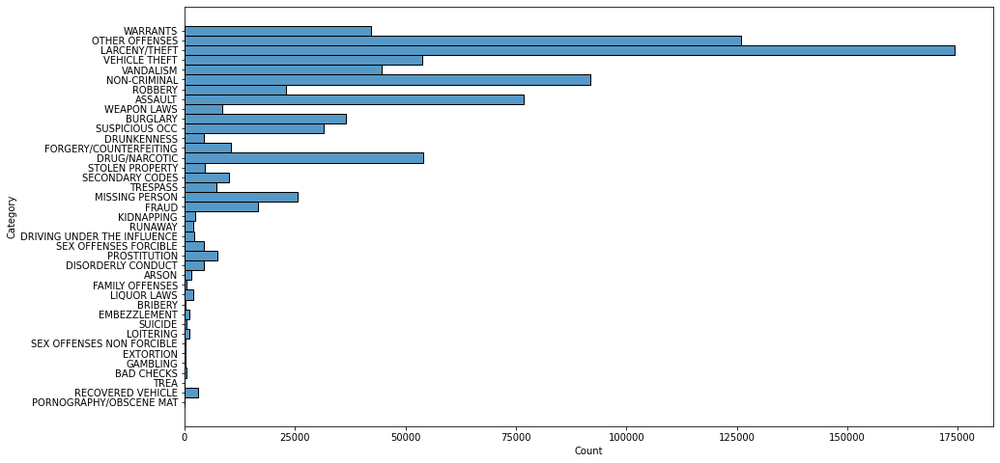

In [ ]:
fig = plt.figure(figsize=(15,8))
sns.histplot(train_df, y="Category", stat="count", bins=12)
plt.show()

Conform this diagram, the most often happening crimes in San Francisco are ```Larceny/theft, other offences, non-criminal, assault, drug/narcotic, vehicle theft, warrants, vandalism, burglary```. Other elements are happening with lower frequency.

## Global crime rate by years, both year halfes by years

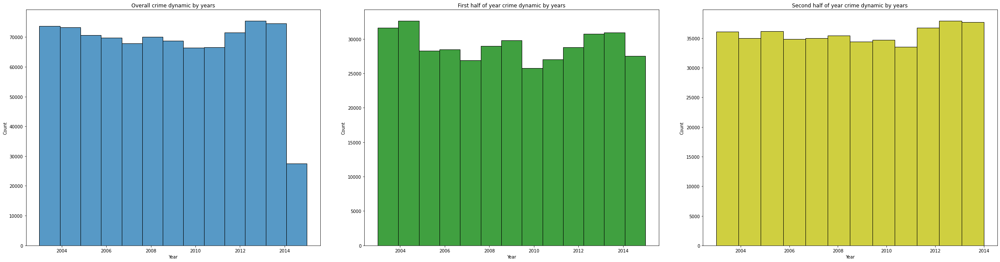

In [ ]:
fig = plt.figure(figsize=(40,10))
fig.subplots_adjust(hspace=0.15, wspace=0.15)

# show general histplot
ax = fig.add_subplot(1, 3, 1)
sns.histplot(data=train_df["Year"], bins=13)    
ax.set_title('Overall crime dynamic by years')

# show distplot for first halfes of each year
ax = fig.add_subplot(1, 3, 2)
sns.histplot(data=train_df[train_df["Month"] < 6]["Year"], bins=13, color="g")
ax.set_title('First half of year crime dynamic by years')

ax = fig.add_subplot(1, 3, 3)
sns.histplot(data=train_df[train_df["Month"] > 6]["Year"], bins=12, color="y")
ax.set_title('Second half of year crime dynamic by years')

plt.show()



*   Statistical data representing count of all crimes by years shows that **last (2015) year is incomplete** and this can be verified if will be requested latest crime record;
*   **First half of each year is more volatile**, showing that crime rate is unstable for first half of each year. Second one is more stable, but **crime value is higher** comparing to the first half.



## Global crime rate by months

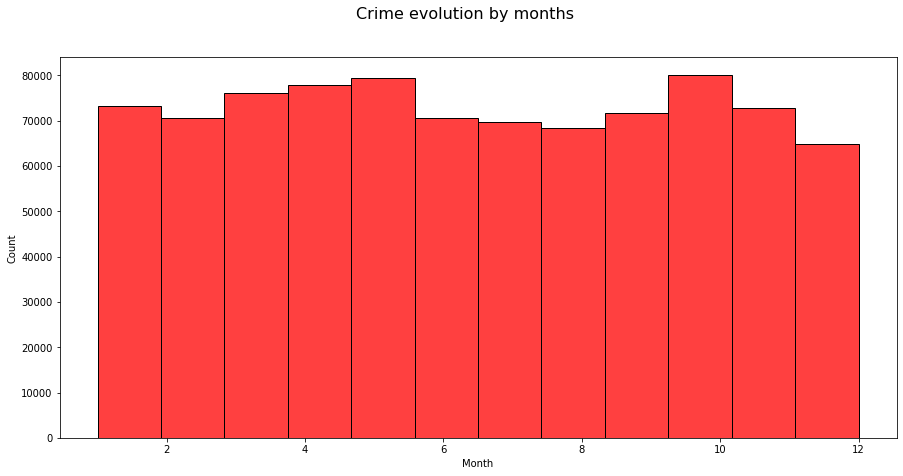

In [ ]:
fig = plt.figure(figsize=(15,7))
fig.suptitle('Crime evolution by months', fontsize=16)
sns.histplot(data=train_df["Month"], bins=12, color="r")
plt.show()

Crime evolution by months show that there is a **crime rate rise during spring and autumn** with **biggest crime rates** in **May** and **October**.

## Correlation of crime rate with unemployment rate

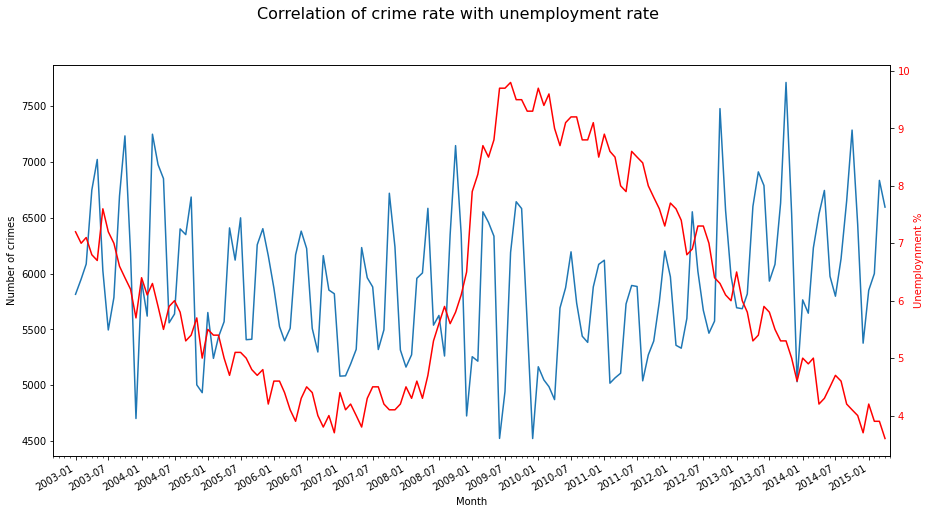

In [ ]:
fig, ax1 = plt.subplots(figsize=(15, 8))

fig.autofmt_xdate()
fig.suptitle('Correlation of crime rate with unemployment rate', fontsize=16)

ax1.plot_date(unemployment_crime_df.index, unemployment_crime_df.CrimesCount, linestyle='solid', marker=None)
ax1.set_ylabel('Number of crimes')
ax1.set_xlabel('Month')

# Major ticks every 6 months.
fmt_half_year = mdates.MonthLocator(interval=6)
ax1.xaxis.set_major_locator(fmt_half_year)

# Minor ticks every month.
fmt_month = mdates.MonthLocator()
ax1.xaxis.set_minor_locator(fmt_month)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.xaxis.set_major_locator(fmt_half_year)
ax2.xaxis.set_minor_locator(fmt_month)

# Text in the x axis will be displayed in 'YYYY-mm' format.
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax2.set_xlim(datetime.datetime(2002, 9, 1), datetime.datetime(2015,5,1))
ax2.set_ylabel('Unemploynment %', color='red')
ax2.tick_params(axis='y', labelcolor='red')
ax2.plot_date(unemployment_crime_df.index, unemployment_crime_df.Rate, color='red', linestyle='solid', marker=None)

plt.show()

## Crime rate per month by years

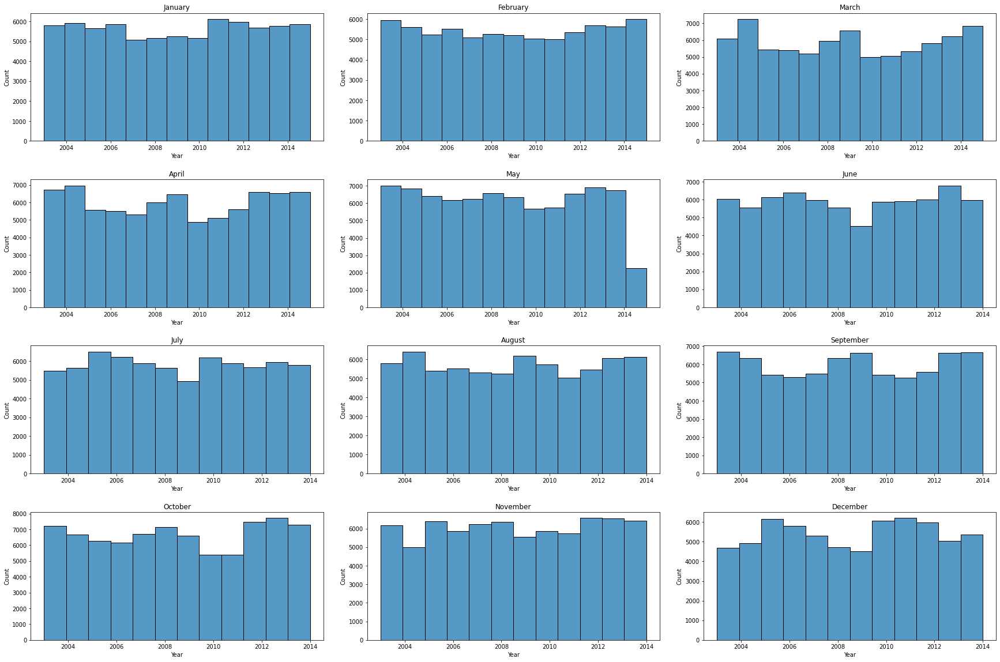

In [ ]:
fig = plt.figure(figsize=(30,20))
fig.subplots_adjust(hspace=0.3, wspace=0.15)
months = np.sort(train_df["Month"].unique())
month_labels = ['January', 'February',
                'March', 'April', 'May',
                'June', 'July', 'August',
                'September', 'October', 'November',
                'December']

for index in range(1, 6):
    ax = fig.add_subplot(4, 3, index)
    sns.histplot(data=train_df[train_df["Month"] == months[index - 1]]["Year"], bins=13)
    ax.set_title(month_labels[index - 1])
    
for index in range(6, 13):
    ax = fig.add_subplot(4, 3, index)
    sns.histplot(data=train_df[train_df["Month"] == months[index - 1]]["Year"], bins=12)
    ax.set_title(month_labels[index - 1])

plt.show()

Conform shown graphs the highest crime rates are during spring months and october. Other months have lower values. **In one half of months** (March, April, May, August, September, October) can be observed that **crime rate becomes lower between 2005-2007 and 2010-2012**. Months from another half (January, February, June, July, November, December) have not so clear distribution of data. 

## Crime distribution between seasons

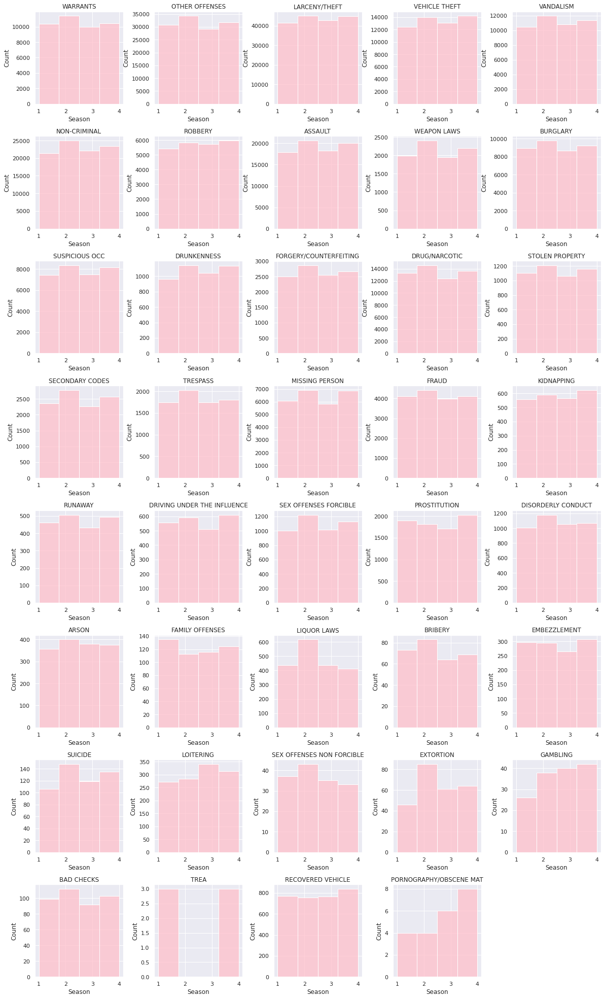

In [ ]:
sns.set(font_scale=1)
fig = plt.figure(figsize=(20, 35))
fig.subplots_adjust(hspace=0.35, wspace=0.35)
index = 1

for elem in train_df["Category"].unique():
    plt.subplot(8, 5, index)
    index += 1
    sns.histplot(train_df[train_df['Category'] == elem]['Season'], bins=4, color='pink')
    plt.title(elem)

Basing on seasons can be seen that durint Spring and Autumn there is a rise of crime-rate, making those seasons more dangerous. This correlates with previously made analysis by months.

## Correlation of crime rate and weather

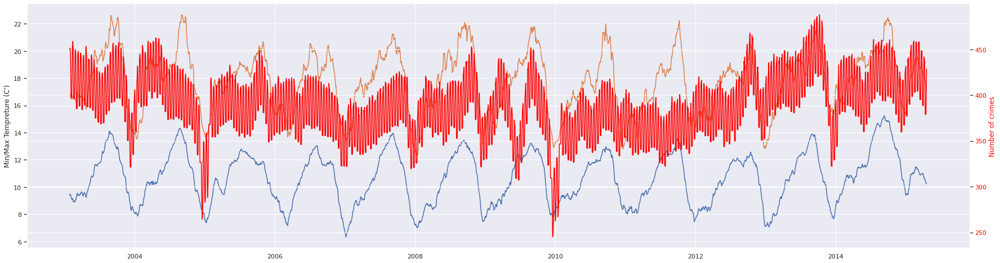

In [ ]:
fig, ax = plt.subplots(figsize=(30, 8))

ax.plot(weather_train_daily_mean_df.index, weather_train_daily_mean_df.TMIN)
ax.plot(weather_train_daily_mean_df.index, weather_train_daily_mean_df.TMAX)
ax.set_ylabel("Min/Max Tempreture (C')")

ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis
ax2.plot(weather_train_daily_mean_df.index, weather_train_daily_mean_df.CrimesCount, color='red')
ax2.set_ylabel("Number of crimes", color='red')
ax2.tick_params(axis='y', labelcolor='red')

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/869141476637044746/t_cimes.png')
# General crime rate

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/869141468814667776/t_crimes_assault.png')
# Assault crime rate

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/869146298555715614/download_8.png')
# Theft crime rate

The temperature in San Francisco is **stable of the most part of the year**, varying between 8 and 25 degrees Celsius. The **distribution of the crimes over the days of year is bimodal with peaks during the spring and autumn**. The second **peak corresponds to the period with maximal annual temperature**. It can be seen that **violent crimes (such as Assault) have a stronger dependency** on the temperature, and their **frequency increases in the warm season**.

## Correlation between crimes and type of weather (good or bad one)

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/869144925130870784/crimes_normal_thunder.png')

## Crime rate distributed between days of year

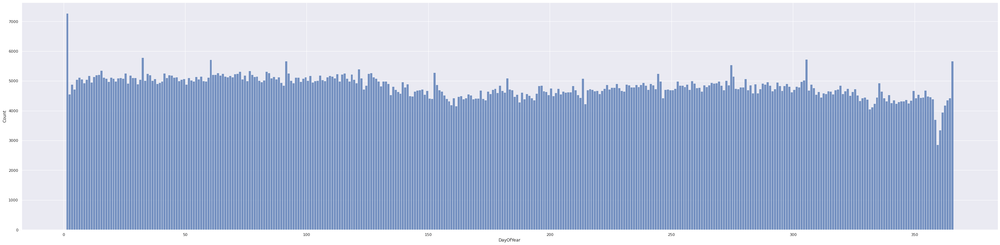

In [ ]:
fig = plt.figure(figsize=(50, 12))
sns.histplot(data=global_df['DayOfYear'], bins=365)
plt.show()

Distribution of crimes between days of year looks stable with deviations that are random by nature, but there are days when crime rate rises too high. Analysis of those days led to some interesting observations:

*    1st January       - New Year
*    32th day - 01.02  - National Freedom Day
*    91th day - 01.04  - April Fool's day
*    152th day - 01.06 - Kid's day
*    213th day - 01.08 - American Family Day
*    305th day - 01.11 - Helloween (31st October)
*    359th day (drop)  - 25.12 Christmas

## High-rate and low-rate crimes distribution by hours

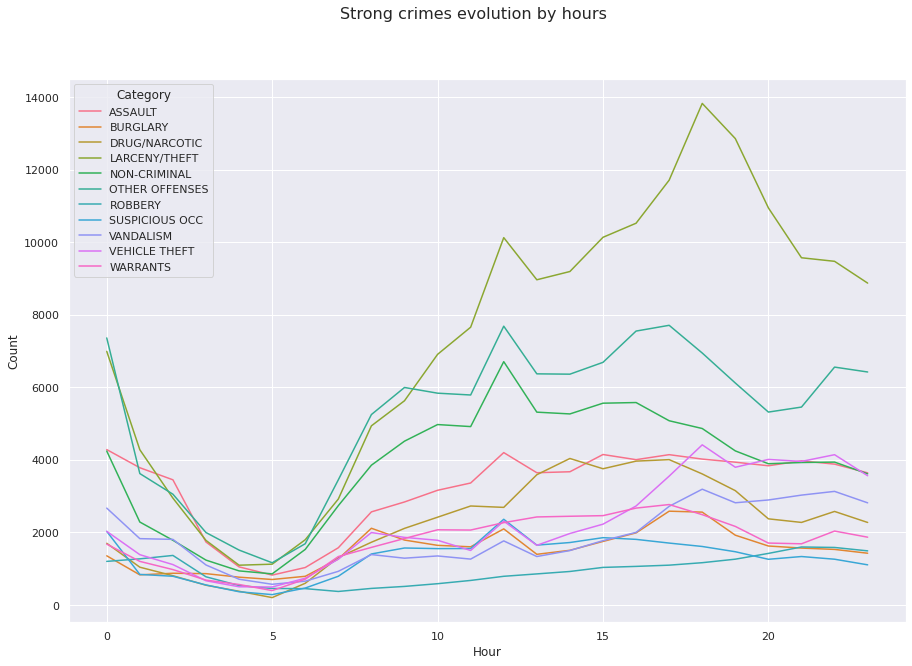

In [ ]:
fig = plt.figure(figsize=(15, 10))
fig.suptitle('Strong crimes evolution by hours', fontsize=16)
sns.lineplot(
    data=hour_count_df[hour_count_df["Category"].isin(strong_crimes)], 
    x="Hour", y="Count", 
    hue="Category"
)
plt.show()

Next observations were made based on visual analysis **high-rate crimes** distribution per hour:

*   **Global min rate** of all crimes is placed **at 5 AM**, making this time of day the safest;
*   There is presented an **anomaly rise** of crime rate **at 12 AM** on almost all presented crimes (**at lunch time**);
*   **Max crime rate** is presented in time interval **between 4-6 PM** (at time **when people start getting home from work**);
*   **Crime rate is high during the daylight and decreases at night**.

This graph visualizes one of the most important problems with this dataset: there are **categories that have too high crime rate**. With such distribution classification model can pay more attention to high-rate crimes, decreasing efficiency of classification model overall.

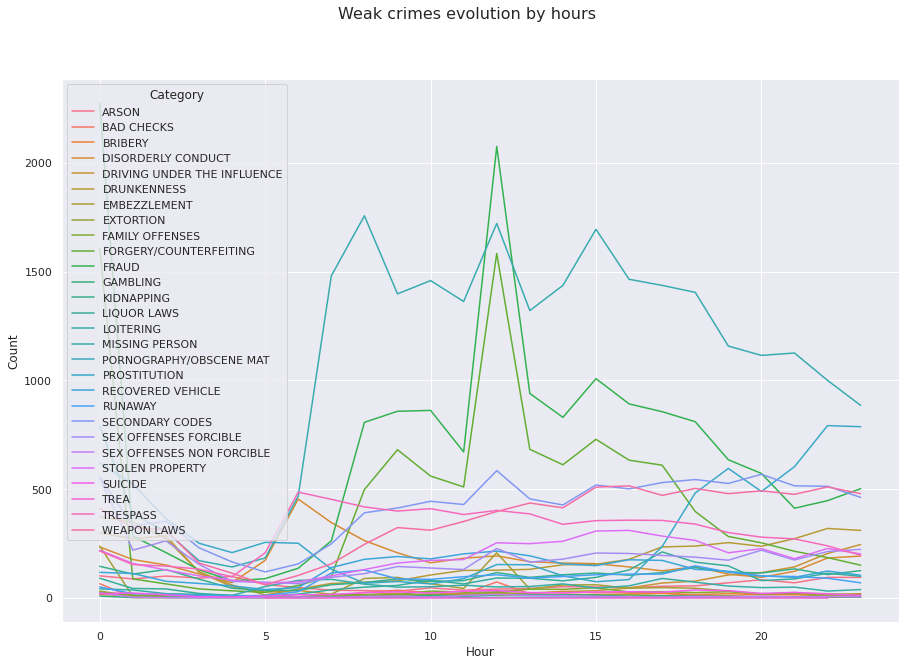

In [ ]:
fig = plt.figure(figsize=(15, 10))
fig.suptitle('Weak crimes evolution by hours', fontsize=16)
sns.lineplot(
    data=hour_count_df[hour_count_df["Category"].isin(weak_crimes)], 
    x="Hour", y="Count", 
    hue="Category"
)
plt.show()

Crime distribution for **low-rate crimes** is different from one presented before. Observations:

*    **Crime rate min** is placed **at 5 AM**;
*    **Anomaly crime rate rise** in time interval **between 6-8 AM**;
*    **Anomaly crime rate rise at 12 AM**;
*    **Unstable crime behavior**: if in high-rate crimes distribution is decreasing from 19 PM, here some crimes are increasing till midnight, after which they start to match overall distribution;
*    For **half of low-rate crimes distribution is unclear** and **has too small value of records** for performing effective analysis.

This graph shows another problem with dataset. Visually all categories from low-rate crimes can be separated in two groups: one still can be effectively used for training model for classification, but second part has too small value of records. The only way I see how to make classification model usable to find those cases - **place higher 'weights'** for those records.

## Global crime rate by hour

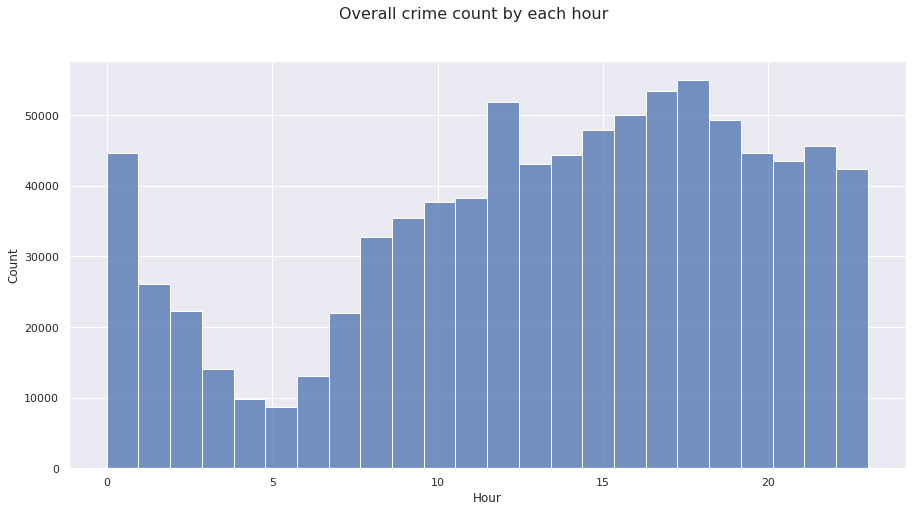

In [ ]:
fig = plt.figure(figsize=(15, 7.5))
fig.suptitle('Overall crime count by each hour', fontsize=16)
sns.histplot(data=train_df, x="Hour", stat="count", bins=24)
plt.show()

Conform presented diagram distribution of **crimes highest rate is presented at 12 AM and 17-18 PM**. Global min of all crimes happen at 5 AM.
This time distribution correlates with previously estimated graphs for crimes by their categories.

In order to perform better visual analysis of the crime rate distribution between hours there is required multiple barplot diagram.

## Crime-rate by categories considering week day when they happened

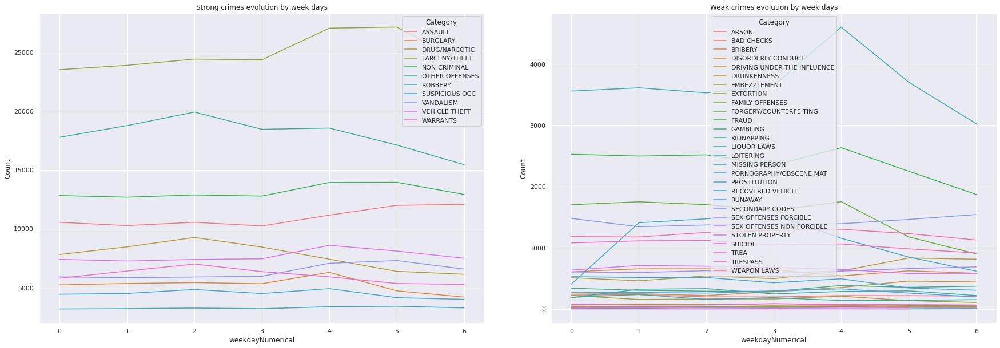

In [ ]:
fig = plt.figure(figsize=(30, 10))
fig.subplots_adjust(hspace=0.15, wspace=0.15)

ax = fig.add_subplot(1, 2, 1)
sns.lineplot(
    data=weekday_count_df[weekday_count_df["Category"].isin(strong_crimes)], 
    x="weekdayNumerical", y="Count", 
    hue="Category"
)
ax.set_title('Strong crimes evolution by week days')

ax = fig.add_subplot(1, 2, 2)
sns.lineplot(
    data=weekday_count_df[weekday_count_df["Category"].isin(weak_crimes)], 
    x="weekdayNumerical", y="Count", 
    hue="Category"
)
ax.set_title('Weak crimes evolution by week days')

plt.show()

High-rate crimes have clear separation on those that are happening either at start or in the end of the week. Such a shift is caused by character of crime (like, thefts in houses will more likely happen during working days, considering that people will not be home). Center of week is relatively safer time for high-rate crimes.

If high-rate crimes give clear picture about their shifts to specific week days, low-rate crimes are presented in more 'noisy' type and there is no way to effectively analyse their shifts. That is why they require histplot of their week days distribution.

## Low-rate crimes distribution by days of week

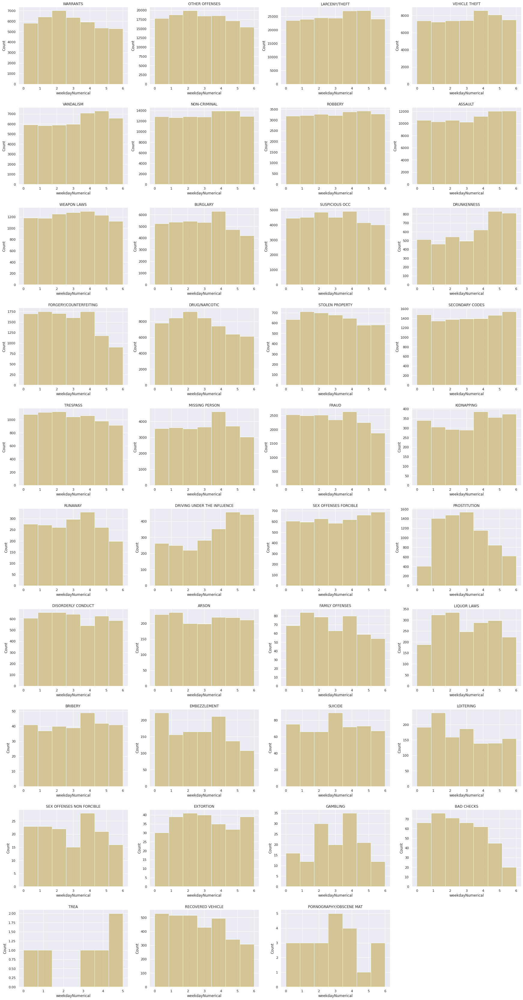

In [ ]:
index = 1
fig = plt.figure(figsize=(30,60))
fig.subplots_adjust(hspace=0.3, wspace=0.2)
week_sorted_data = train_df.sort_values(by=['weekdayNumerical'])

for category in train_df["Category"].unique():
    ax = fig.add_subplot(10, 4, index)
    sns.histplot(data=week_sorted_data[week_sorted_data["Category"] == category]["weekdayNumerical"], bins=7, color="y")
    ax.set_title(category)
    index += 1

plt.show()

All low-rate crimes can be separated in three groups:

*   Crimes that are shifted to the **start of the week**. Those are ```warrants, other offences, forgery/counterfeiting, tresspass, disorderly conduct, family offences, liquor laws, loitering, bad checks, recovered vehicle, embezzlement```.
*   Crimes that are shifted to the **end of the week**. Those are ```larcenty/theft, vehicle theft, vandalism, non-criminal, robbery, assault, drunkenness, kidnapping, driving under the influence, sex offences forcible, bribery```
*   Crimes that happen more often in the **middle of the week**. Those are ```weapon laws, suspicious occ, drug/narcotic, stolen property, missing person, fraud, prostitution, suicide, extortion, gambling, bad checks```

There are some categories that have not entered in the list. The problem with those categories is that there is unstable distribution and therefore no effective way to define where is shifted the crime rate.

## Crime rate depending on day of week and category of crime

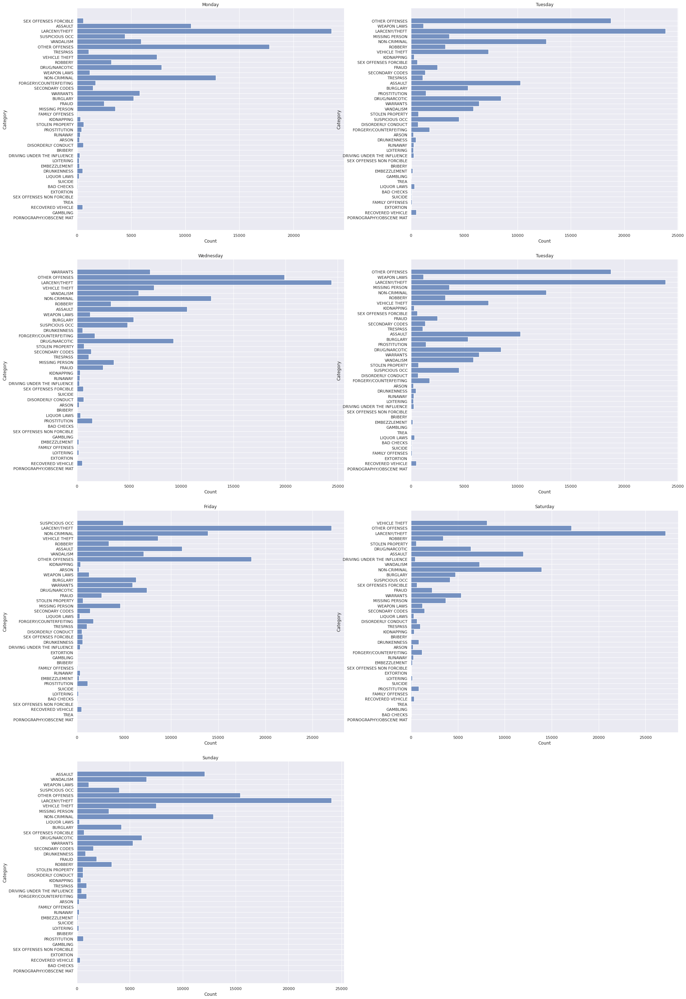

In [ ]:
fig = plt.figure(figsize=(30,50))
fig.subplots_adjust(hspace=0.13, wspace=0.25)
weekday_labels = ['Monday', 'Tuesday', 'Wednesday', 'Tuesday', 'Friday',
                  'Saturday', 'Sunday']

for index in range(1, 8):
    ax = fig.add_subplot(4, 2, index)
    sns.histplot(data=train_df[train_df["DayOfWeek"] == weekday_labels[index - 1]], y="Category", bins=39)
    ax.set_title(weekday_labels[index - 1])

plt.show()

Here some mentions are required:

*     ```Larceny/theft``` is the most often happening crime at each day of week. On the 2-nd place for each day is presented ```other offences```
*     ```Non-criminal, assault, vehicle theft, warrants, drug/narcotic, vandalism, missing person, robbery, fraud, secondary codes, trespass, prostitution, forgery/counterfeiting``` are categories that are less often happening, but they're happening enough times to perform effective classification and analysis.

All categories that were not mentioned have poor value and this amount is too small for performing efficient classification.

## High-rate and low-rate crimes distribution by years

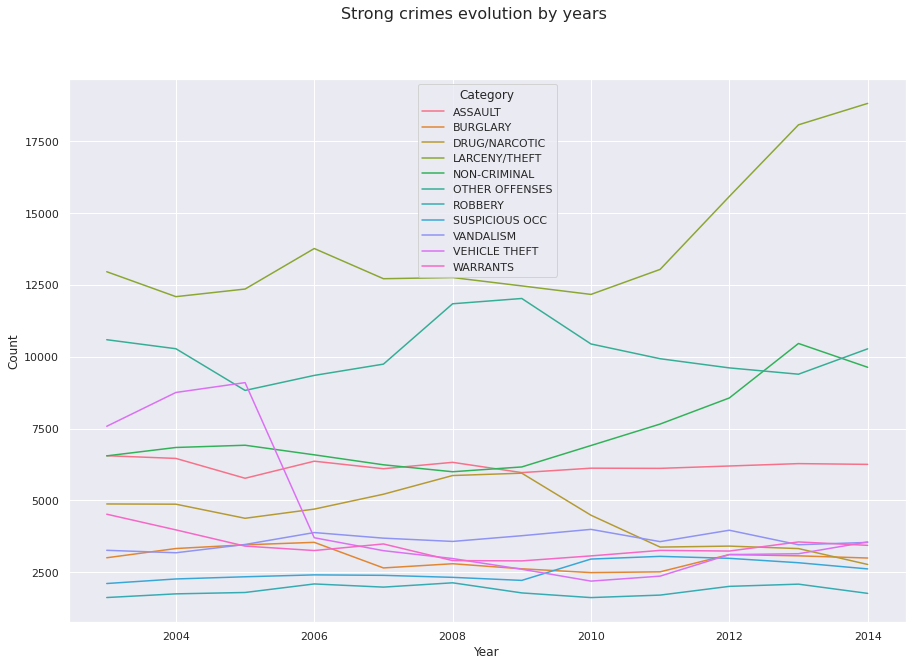

In [ ]:
fig = plt.figure(figsize=(15, 10))
fig.suptitle('Strong crimes evolution by years', fontsize=16)
sns.lineplot(
    data=year_count_df[
        (year_count_df["Category"].isin(strong_crimes)) & (year_count_df["Year"] < 2015)
    ], 
    x="Year", y="Count", 
    hue="Category"
)
plt.show()

Only few of high-rate crimes have **increasing progress of distribution**, rising to **highest values in 2014** (**larceny/theft, non-criminal**). **Drug/narcotic and other offences** crime types **have reached peak between 2008-2009** (which correlates with time of Global Financial Crisis). All other crime types have almost similar distribution, where is no clear increase/decrease. 

The same graph for low-rate crimes gives very 'noisy' picture that can not describe distribution of elements. For being able to make this representation will be used histplot representation.

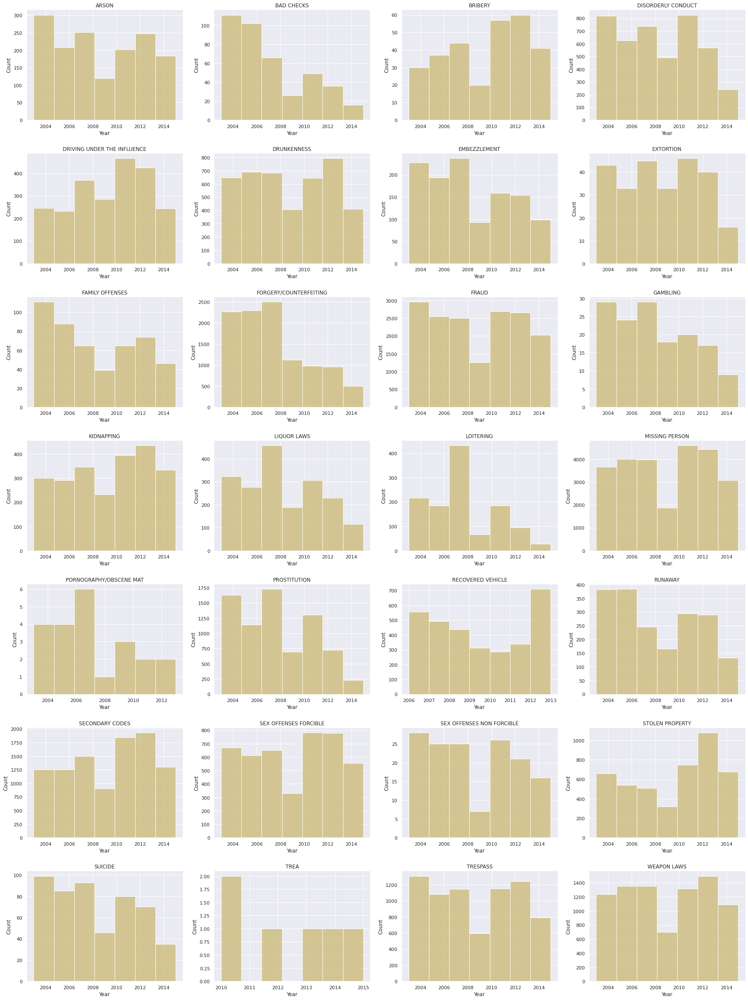

In [ ]:
index = 1
fig = plt.figure(figsize=(30,60))
fig.subplots_adjust(hspace=0.3, wspace=0.2)
year_sorted_data = train_df.sort_values(by=['Year'])

for category in weak_crimes:
    ax = fig.add_subplot(10, 4, index)
    sns.histplot(data=year_sorted_data[year_sorted_data["Category"] == category]["Year"], bins=7, color="y")
    ax.set_title(category)
    index += 1

plt.show()

Analysis will be performed element-wise:

*   ```Warrants``` are **decreasing until 2006**. After this values have stable distribution with small changes;
*   ```Other offences``` has wave-like distribution, where **bottoms are centered at 2005 and 2013**. It is hard to find pattern of the distribution (only **possible rise of this crime with Financial Crisis of 2008**);
*   ```Larceny/theft``` is keeping stable distribution until 2011. **After 2011 crime rate greatly rises** (there is possible connection with change of San Francisco mayor or increase of manufactural productions starting from 2011);
*   ```Vehicle theft``` has strange situation: it is has **high distribution until 2005**, after which is registered a great drop of the crime rate. Conform information that i found on the internet, this happened **because of introducing new locking and security tech in car protection** (link: https://d-nb.info/1165552345/34);
*   ```Vandalism``` has stable distribution, no changes
*   ```Non-criminal``` this activity had stable distribution **until 2008, after which is registered rise of this crime type **(can be connected with Financial Crisis 2008);
*   ```Robbery``` has a wave-like distribution without anomaly drop/rise, but amount of reviewed years does not allow to ensure this hypothesis;
*   ```Assault``` has stable distribution, no changes
*   ```Weapon laws``` has little increase over the time with small deviations. There is no anomaly drops/rises
*   ```Burglary``` has strange distribution, considering the 2003-2006 and starting from 2012 has similar distribution. Interval between **2007-2011 contains drop of crimes (possible connection with Financial Crisis 2008**, considering that many people had financial problems and had less expensive things to sell or money).
*   ```Suspicious occ``` had stable distribution **until 2010, after which is registered rise of values**. Can not find reason why this happened.
*   ```Drunkenness``` has stable distribution with anomaly **rises in 2009 and 2013**. First one can be connected to the fact that people lost many actives in 2008-2009 due to **Financial Crisis 2008 and second-wave recession that happened in 2013** (link: https://en.wikipedia.org/wiki/Great_Recession)).
*   ```Forgery/counterfeiting``` has **great distribution till 2009**. Drop for this type of crime is related to the fact that **people lost many actives during Financial Crisis 2008** and they could not spend money bying forgery. Due to this reason, criminal activity related to forgery has decreased.
*   ```Drug/narcotic``` has similar distribution as ```forgery``` and is considered that reasons defining this drop are the same.
*   ```Stolen property``` crime rate was increasing, from 2008 (until this moment it was decreasing), which shows that **crisis stimulated this type** of crime.
*   ```Secondary codes``` have stable rise rate through entire time interval.
*   ```Tresspass``` has stable distribution, anomaly high crime rate only in 2003.
*   ```Missing person``` has small crime rate rising distribution with small deviations.
*   ```Fraud``` has stable distribution, small defiations
*   ```Kidnapping``` has unstable distribution that is hard to link with any event. Till 2009 there was a rise and after that started unpredictable behaviour.
*   ```Runaway``` has unstable distribution, where till 2007 there was a high crime rate, but after that distribution becomes chaotic and has high deviations
*   ```Driving under the influence``` has very interesting distribution that looks like sum of ```drunkenness``` and ```drug/narcotic```, considering that it correlates with their behavior. This is even a logical connection, considering that **'influence' means either being under alcoholic or narcotic influence**.
*   ```Sex offences forcible``` has stable distribution where is registered small rise starting from 2010
*   ```Prostitution``` has unstable distribution, where till 2007 was presented 'bell down' shape of distribution, but starting from 2008 crime rate has greatly decreased. This can be connected to the time when appeared **proposition K** that would allow prostitution to become a legal business that could be monitored and would not be chased by police. In **november 2008 this proposition was rejected** and this is the reason why till 2008 there can be observed rise of prostitution and after the moment when law was rejected there is a strong decrease (links: https://ballotpedia.org/San_Francisco,_California,_Proposition_K,_Decriminalization_of_Prostitution_Initiative_(November_2008) and https://www.tandfonline.com/doi/full/10.1016/S0968-8080%2809%2934469-9)
*   ```Disorderly conduct``` has similar distribution with ```driving under the influence``` but there is no stable connection with any event or another category
*   ```Arson``` looks like distribution with periodic principle, but there is small amount of records and small time interval for making such a suggestion

All other categories are poorly presented in the dataset, making those categories unusable for analysis and for finding patterns in their distribution.

As a final touch that will specify 'shift' of crimes to specific years is to show barplot that will visualise crime distribution.



/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


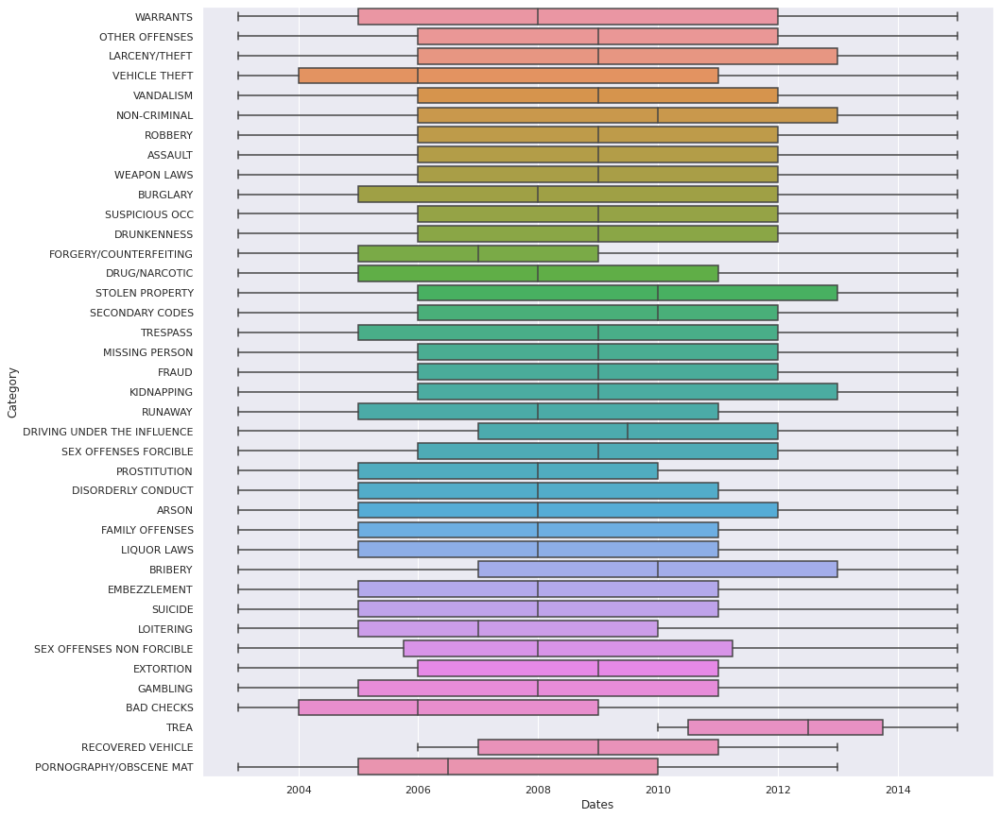

In [ ]:
fig = plt.figure(figsize=(15,15))
sns.boxplot(pd.to_datetime(train_df.Dates).dt.year, train_df.Category)
plt.show()

## Gang activity by week day and where it was observed

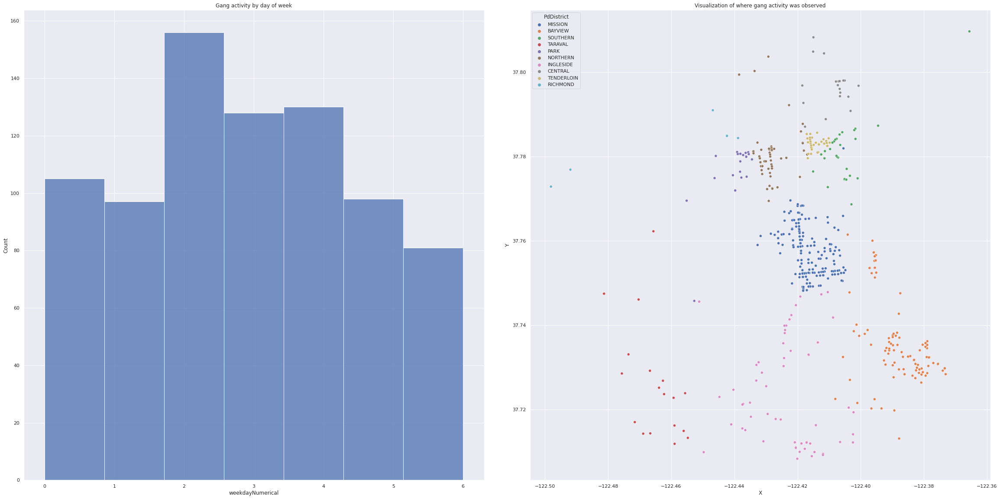

In [ ]:
fig = plt.figure(figsize=(40,20))
fig.subplots_adjust(hspace=0.15, wspace=0.10)

ax = fig.add_subplot(1, 2, 1)
sns.histplot(
    data=train_df[train_df["Descript"] == "GANG ACTIVITY"], x="weekdayNumerical", 
    stat="count", bins=7
)
ax.set_title('Gang activity by day of week')

ax = fig.add_subplot(1, 2, 2)
sns.scatterplot(
    data=train_df[train_df["Descript"] == "GANG ACTIVITY"], x="X", y="Y", 
    hue="PdDistrict"
)
ax.set_title('Visualization of where gang activity was observed')

plt.show()

In the ```descript``` feature were present records that define gang members observations. Considering opinion that violent and complex-organized crimes are performed by gangs was decided to visualize distribution of gang activities in days of week and basing on their location.

Conform reviewed informational resources **most of crimes are happening in the Tenderloin, Central, Southern, and Mission districts**. Conform scatterplot data most of records are distributed conform mentioned principle.  Another region where are many records about gang activity is **BayView**.

Distribution of gang activity observations between days of week shows that **gang members are often showing in the Wednesday and distribution is shifted to the week middle**.

This data will be necessary when will be shown heatmap of crime distribution basing on their location.

## Where crimes happened separated by categories

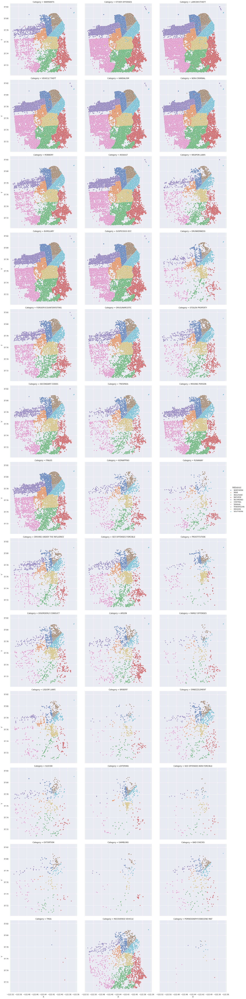

In [ ]:
g = sns.FacetGrid(train_df, col="Category", hue="PdDistrict", col_wrap=3, height=7)
g.map(sns.scatterplot, "X", "Y", alpha=.7)
g.add_legend()
plt.show()

Observations based on graph:

*   ```Weapon Laws, drunkenness, stolen property, trespass, kidnapping, runaway, driving under the influence, sex offences forcible, prostitution, disorderly conduct, arson, family offences, liquor laws, bribery, embezzlement, suicide, loitering, sex offences non forcible, extortion, gambling, bad checks, trea, pornography/obscene mat``` are poor location-distribution crimes, meaning that there will be low efficiency for defining probability of those crimes;
*   Other categories of crimes that are not mentioned in list above will have effective distribution for estimation of their probability;
*   Almost all categories are concentrated in the center of San-Francisco and amount of records there is high. Considering that there are many records and each district can have its own 'crime center' it is required to use heatmap for showing most criminal regions.

Categories with poor location-distribution can suffer from uneffective classification that will be simply based on location and this is the reason why is required deeper analysis of data.



## Frequency statistics of crime by streets

In [ ]:
print(streets_crime_freq_df)

                             LOMBARD ST  BRODERICK ST  ...  SANTA YSABEL  WEBB PL
LARCENY/THEFT                     657.0         168.0  ...           1.0      1.0
NON-CRIMINAL                      238.0          82.0  ...           NaN      NaN
OTHER OFFENSES                    219.0          78.0  ...           1.0      NaN
BURGLARY                          216.0         148.0  ...           NaN      NaN
ASSAULT                           174.0          54.0  ...           NaN      NaN
VANDALISM                         150.0          50.0  ...           NaN      NaN
VEHICLE THEFT                     130.0          57.0  ...           NaN      NaN
SUSPICIOUS OCC                     82.0          32.0  ...           NaN      NaN
DRUG/NARCOTIC                      77.0           9.0  ...           NaN      NaN
WARRANTS                           73.0          12.0  ...           NaN      NaN
ROBBERY                            50.0          12.0  ...           NaN      NaN
FRAUD           

Crime distribution between streets is different, considering that some categories happen more often on one street and less often on another. Considering that we can define probability of crime by its location.

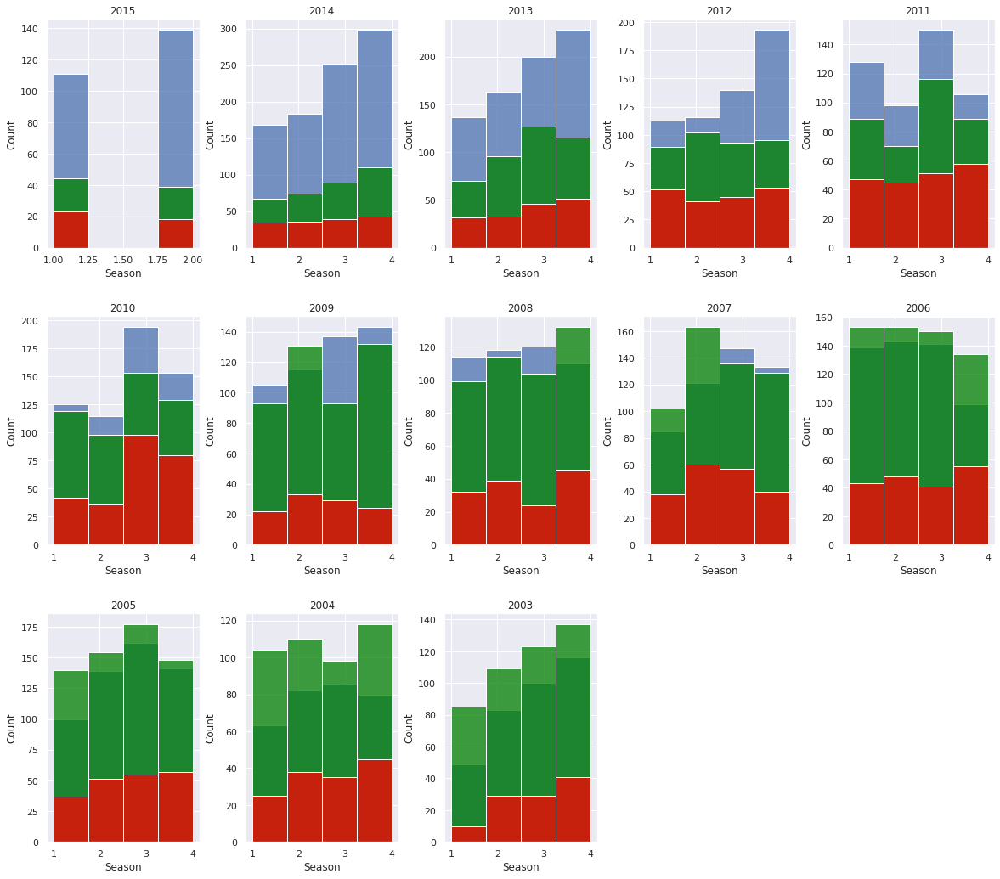

In [ ]:
fig = plt.figure(figsize=(20, 50)) 
fig.subplots_adjust(hspace=0.3, wspace=0.3)
index = 1 

for elem in train_df.Year.unique(): 
    plt.subplot(8, 5, index) 
    index += 1 
     
    sns.histplot(x=train_df[(train_df['Street'] == 'BRYANT ST') & (train_df['Category'] == 'LARCENY/THEFT')  
                     & (train_df['Year'] == elem)]['Season'], bins=4, multiple="stack") 
    
    sns.histplot(x=train_df[(train_df['Street'] == 'BRYANT ST') & (train_df['Category'] == 'NON-CRIMINAL')  
                     & (train_df['Year'] == elem)]['Season'], bins=4, color='green', multiple="stack") 
     
    sns.histplot(x=train_df[(train_df['Street'] == 'BRYANT ST') & (train_df['Category'] == 'ASSAULT')  
                     & (train_df['Year'] == elem)]['Season'], bins=4, color='red', multiple="stack") 
                             
    plt.title(elem)

## Crime distribution by district

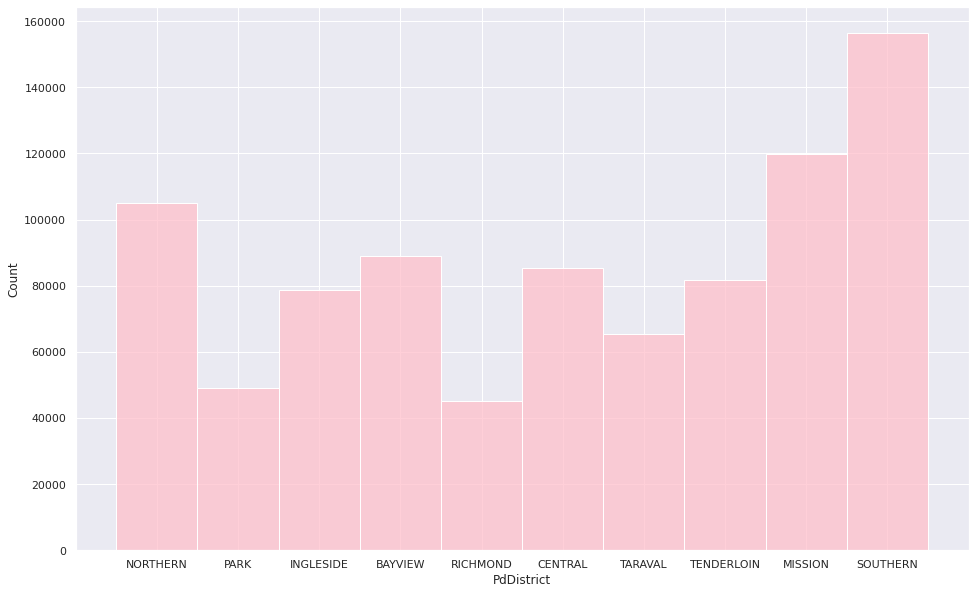

In [ ]:
plt.figure(figsize=(16,10))
sns.histplot(train_df['PdDistrict'], color='pink')
plt.show()

From this distribution can be clearly seen that district has highest crime rate and what districts are the safest in town

## Crime distribution by police district

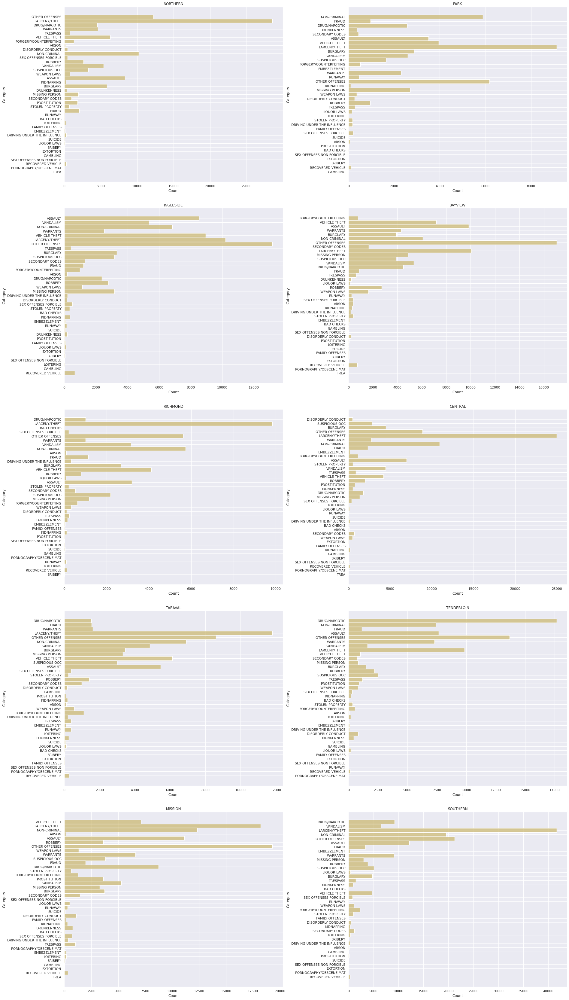

In [ ]:
index = 1
fig = plt.figure(figsize=(30,60))
fig.subplots_adjust(hspace=0.15, wspace=0.3)

for district in train_df['PdDistrict'].unique():
    ax = fig.add_subplot(5, 2, index)
    sns.histplot(data=year_sorted_data[year_sorted_data['PdDistrict'] == district], y='Category', bins=39, color="y")
    ax.set_title(district)
    index += 1

plt.show()

Conform distribution ```NORNTHERN, CENTRAL, SOUTHERN, TENDERLOIN, BAYVIEW, MISSION``` are the most dangerous regions in San-Francisco (East part of the town). Also in different districts different type of crime are predominant (for example in ```TENDERLOIN``` it is ```drug/narcotic```, in ```SOUTHERN``` it is ```THEFT```, for ```MISSION, INGLESIDE, BAYVIEW``` it is ```other offences```.

## Crime distribution between streets and intersections

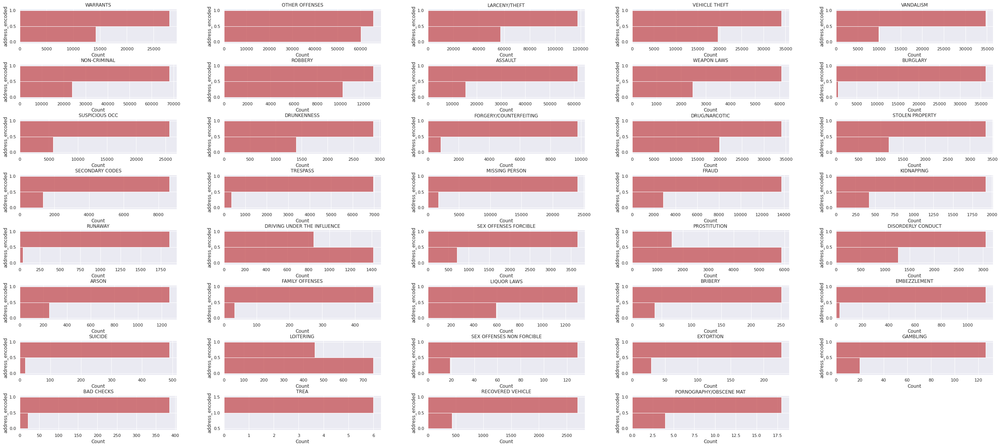

In [ ]:
index = 1
fig = plt.figure(figsize=(45,20))
fig.subplots_adjust(hspace=0.6, wspace=0.3)

for category in train_df['Category'].unique():
    ax = fig.add_subplot(8, 5, index)
    sns.histplot(data=train_df[train_df['Category'] == category], y='address_encoded', bins=2, color="r")
    ax.set_title(category)
    index += 1

plt.show()

In most of the cases crimes happen at the streets, but here can be observed interesting moment that different crimes have different proportion between streets and intersections.

## Crime heatmap by districts

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/868128322960379914/FroXCAQAMp3AAwCyFo5fCAQAMp3AAwBx7OLopHADAcAYOAGA4SyoAsFJZUlkDhQMAGE7hAIBZCkcvhQMAGE7hAIA59nB0UzgAgOE.png')

This heatmap provides overall crime picture, where is visually clear that there is high crime rate at ```Southern``` district, but this heatmap does not consider crime rate in respect to district area.

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/868129230410629151/download_1.png')

Only with this heatmap can be clearly seen that there is a high crime rate in respect to area in ```Tenderloin``` district.

## Tenderloin crime heatmap

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/868129114673008640/z8IwtgcVqvGfwAAAABJRU5ErkJggg.png')

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/868136448380010557/tenderloin_crime_rate_sf_eda.gif')

## Crime heatmap by weekdays separated by regions where they happened

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/850289373261332502/867301091204136990/sf-crime-evolution-weekdays.gif')

Crime rate analysis by weekdays will be performed for each region separately:

*   ```Central``` always has high-crime-rate location near with ```southern``` that has small changes during week, but there is one more high-crime-rate location that appears from Thursday and keeps until Sunday and it is placed in the center of ```Central``` district. One more interesting moment is that crime rate from other parts of disrtict reduces if this 'central' appears and grows.
*   ```Southern``` has almost stable crime rate picture. There are 2 crime centers located on the border with ```central``` and one more located on border with ```bayview``` district. Distribution keeps almost the same through entire week.
*   ```Tenderloin``` district has high crime rate on its entire area. There are small crime 'gaps' in Thursdays and Saturdays, but overall amount of crimes is always high.
*   ```BayView``` crime rate rises at the end of the week, but is lower in the first week half. Interesting moment is that there is one strong crime center and one weak crime center. Weak crime center is located at the Portraro Hill (i can not find why) and it is a little stronger in the beginning of the week. Strong crime center is located in the turistical part of this district (there are placed Hilltop and India Basin Shoreline parks, Youngblood-Coleman Playground and other interesting subjects.
*   ```Ingleside``` district has 3 crime centers with high crime rate. This is a residential area and considering the fact that crime rate here is lower at the end of week shows that residential area is more interesting for criminals during workdays.
*   ```Taraval``` district has almost stable crime-rate distribution, but there is one interesting moment: there are 2 crime centers, one of which is located between Merced Manor and Monterey Heights, and another one (bigger one) located between OceanView and Ingleside Terraces.
*   ```Richmond``` district is interesting, considering that there is small crime rate in the park. Almost all crimes that are happening in this district are concentrated in residential area. Crime rate works by the same principle as in the ```Ingleside``` district - this region has high crime rate during working days.
*   ```Park``` district has higher crime rate during working days and has 2 crime centers. Bigger crime center is located near with Buena Vista park and another one is located near with Color Fountain park.
*   ```Northern``` district is a strange one. It is almost the same during any weekday, but there is one small crime center, located near with Japantown and Laguna Heights.

For better understanding of how crime rate works for districts it is required to make barplots with distribution by weekdays.

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/868076467257503754/H87dywAAAAAMMjfes8wCiQAAAAAAICJmwEAAAAAAAAAAAAAAAAAAAAAAAAAAAAmbgYAAAAAAAAAAAAAAAAAAAAAAAAAAACYuBkAA.png', width=600, height=600)

## Crime heatmap by hours separated by regions where they happened

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/850289373261332502/867305225982574632/sf-crime-evolution-hour.gif')

Crime rate analysis by weekdays will be performed for each region separately:

*   ```Central``` has two crime centers that were mentioned during week analysis, but distribution has pattern with small deviations: during the night crime center placed in the center of district is becoming stronger, making crime center on the border with ```southern``` becomes weaker. During the day crime center on the mentioned border is much stronger and crime center placed in center of the district is weaker. Conform general distribution, high crime rate overall is reached at 9-11 PM.
*   ```Southern``` has pattern where crime center on the border with ```BayView``` is stable strong and has high crime rate. Another crime center placed near with ```Tenderloin``` is stronger during night and in the evening. 
*   ```Tenderloin``` looks like one big crime center, where higher crime concentration can be observed in the evening
*   ```BayView``` there are also presented 2 crime centers and touristic one is stronger. Interesting moment is that there are more records during the evening, but distribution of crimes becomes more even during the night
*   ```Ingleside``` Has 3 stable crime centers that have small deviation in size of those centers and all of those centers are placed in parks
*   ```Taraval``` has the most unstable crime distribution. During day crime rate is more distributed through district and there are mentioned before 2 crime centers, but during 12 PM - 2 AM there appears one more crime center located in Sunset and Parkside.
*   ```Richmond``` has high distribution of crimes during evenings and nights. During day there is the same picture as presented for days of week. It is considered as distribution that happens because this is a residual area and people get there during evening and stay there at night
*   ```Northern``` has very high concentration of crimes in Chinatown
*   ```Park``` has the same crime distribution as in previously reviewed section. 

For better understanding of how crime rate works for districts it is required to make barplots with distribution by weekdays.

## Sexual crimes heatmaps

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/868048353039110155/sex_crimes_sf_eda.gif')

Sexual crimes have similar distribution, where can be found 2 crime centers: one is located in the ```Tenderloin``` and another one in the south-east of the ```Mission``` district

## Financial crimes heatmaps

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/868048421284622407/financial_crimes_sf_eda.gif')

Almost all financial crimes are centered in the ```Tenderloin``` district. This happens because this district is considered as business center of San-Francisco, so there are many financial insititutions that are targets for criminals.

## Forgery crimes heatmaps

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/868048496815661056/counterfeiting_sf_eda.gif')

This crime type is centered in the ```Tenderloin``` and ```Central``` districts, considering that there are people that afford expensive goods/services.

## Missing persons/kidnapping heatmaps

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/868048575219789874/person_missing_sf_eda.gif')

Kidnapping happens most of the time in the ```Tenderloin``` district. This is logic considering that in most of the cases kidnapping is connected with money extortion. In most of the cases persons disappear in ```BayView``` that is considered as one of the touristical districts.

The problem is that it is hard to separate this 2 crime types. Suggestion is that those crimes are connected and have similar reasons.

## Theft crimes heatmaps

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/868048640030171166/thefts_sf_eda.gif')

Most of thefts are happening in the center of San-Francisco where are located rich persons or some expensive goods.

## Aggressive behavior crimes heatmaps

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/868048744803872798/bad_behavior_sf_eda.gif')

Crimes with aggressive behavior happen in most of the cases near with center of San-Francisco and there are small rises of crime in ```Mission``` district.

## Drug/narcotic/alcoholic crimes heatmaps

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/868048818694926346/drug_liquor_sf_eda.gif')

All crimes that are based on consumation of drugs/alcohol have similar distribution and are more concentrated in ```Mission``` and ```Tenderloin``` districts with small rise in ```Richmond``` district

## Secondary and hard-to-identify crimes heatmaps

In [ ]:
Image(url='https://cdn.discordapp.com/attachments/868048230276022294/868048896667025458/secondary_elements_sf_eda.gif')

It is hard to classify those crimes, but they have similar distribution, where crimes are happening in ```Tenderloin``` district and northern part of ```Mission``` district